<a href="https://colab.research.google.com/github/yjenny2512/My-personal-repository/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# 🐶End-to-end multiclass Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem

Identifying the breed of a dog given an image of a dog

When i'm sitting at a cafe and I take a photo of a dog,I want to know what breed of dog it is

## 2. Data

The data we're using is from Kaggle's dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction for each dog breed of each test image.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## 4. Features

Some info about the data :
* We're dealing with images(unstructured data) so it's probably best we use deep learning/transfer learning .
* There are 120 breeds of dogs(this means there are 120 different classes)
* There are around 10,000+ images in the traning set(these images have labels)
* There are around 10,000+ images in the test set(these images have no labels)


In [ ]:
# Unzip the uploaded data into Google Drive
!unzip "/content/drive/MyDrive/Dog vision/dog-breed-identification.zip" -d "/content/drive/MyDrive/Dog vision/"

# Get our workspace ready

* Import TensorFlow
* Import TensoFlow Hub
* Make sure we're using the GPU


In [ ]:
!pip install tensorflow --upgrade
!pip install tensorflow_hub --upgrade
!pip install keras --upgrade

  Using cached tensorflow-2.18.0-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (4.1 kB)
  Using cached tensorboard-2.18.0-py3-none-any.whl.metadata (1.6 kB)
  Using cached keras-3.8.0-py3-none-any.whl.metadata (5.8 kB)
  Using cached ml_dtypes-0.4.1-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (20 kB)
Using cached tensorflow-2.18.0-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (615.4 MB)
Using cached keras-3.8.0-py3-none-any.whl (1.3 MB)
Using cached ml_dtypes-0.4.1-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (2.2 MB)
Using cached tensorboard-2.18.0-py3-none-any.whl (5.5 MB)
  Attempting uninstall: ml-dtypes
    Found existing installation: ml-dtypes 0.3.2
    Uninstalling ml-dtypes-0.3.2:
      Successfully uninstalled ml-dtypes-0.3.2
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.15.2
    Uninstalling tensorboard-2.15.2:
      Successfully uninstalled tensorboard-2.15.2
  Atte

  Using cached tensorflow-2.15.1-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (4.2 kB)
  Using cached ml_dtypes-0.3.2-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (20 kB)
  Using cached tensorboard-2.15.2-py3-none-any.whl.metadata (1.7 kB)
  Using cached keras-2.15.0-py3-none-any.whl.metadata (2.4 kB)
Using cached tensorflow-2.15.1-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (475.3 MB)
Using cached keras-2.15.0-py3-none-any.whl (1.7 MB)
Using cached ml_dtypes-0.3.2-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (2.2 MB)
Using cached tensorboard-2.15.2-py3-none-any.whl (5.5 MB)
  Attempting uninstall: ml-dtypes
    Found existing installation: ml-dtypes 0.4.1
    Uninstalling ml-dtypes-0.4.1:
      Successfully uninstalled ml-dtypes-0.4.1
  Attempting uninstall: keras
    Found existing installation: keras 3.8.0
    Uninstalling keras-3.8.0:
      Successfully uninstalled keras-3.8.0
  Attempting uninstall: tensorb

  Using cached keras-3.8.0-py3-none-any.whl.metadata (5.8 kB)
Using cached keras-3.8.0-py3-none-any.whl (1.3 MB)
  Attempting uninstall: keras
    Found existing installation: keras 2.15.0
    Uninstalling keras-2.15.0:
      Successfully uninstalled keras-2.15.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.15.1 requires keras<2.16,>=2.15.0, but you have keras 3.8.0 which is incompatible.
dopamine-rl 4.1.2 requires tf-keras>=2.18.0, but you have tf-keras 2.15.1 which is incompatible.
tensorflow-text 2.18.1 requires tensorflow<2.19,>=2.18.0, but you have tensorflow 2.15.1 which is incompatible.


In [ ]:
# Import TensorFlow into Colab
import tensorflow as tf
print("TF version : ",tf.__version__)
print(tf.image.convert_image_dtype)

TF version :  2.15.0
<function convert_image_dtype at 0x7f6dcd5aa5c0>


In [ ]:
# Import necessary tools
import tensorflow_hub as hub
#!pip install tensorflow_hub --upgrade
print("TF Hub version: ", hub.__version__)

# Check for GPU availability
print("GPU","available" if tf.config.list_physical_devices("GPU") else "not available")

TF Hub version:  0.13.0
GPU not available


## Getting our data ready (turning into Tensors)

With all machine learning models,our data has to be in numerical format.So that's what we'll be doing first.Turning our images into Tensors(numerical representations)

Let's start by accessing our data and checking out the labels

In [ ]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


<Axes: xlabel='breed'>

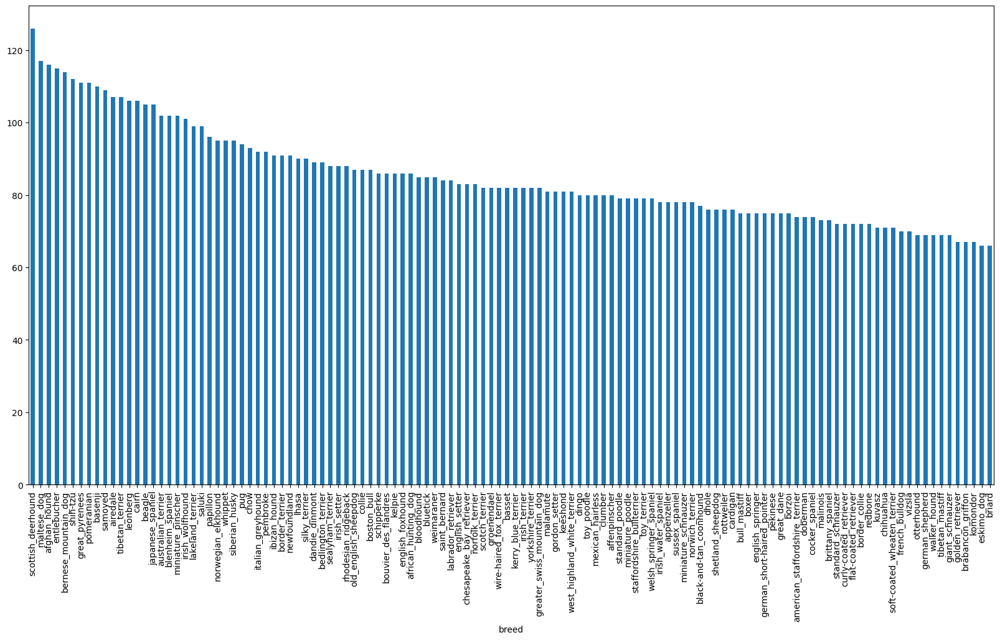

In [ ]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

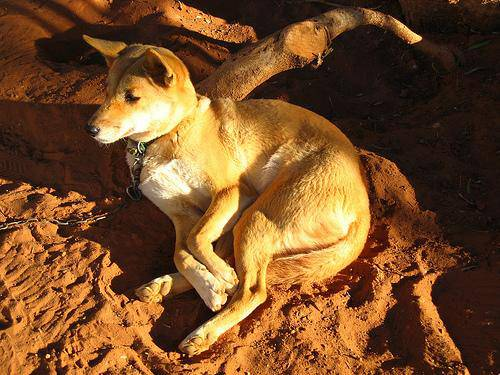

In [ ]:
# Let's view an image
from IPython.display import Image
Image("drive/MyDrive/Dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and the labels

Let's get a list of all our image file pathnames

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create pathnames from Image ID's
filenames = ["drive/MyDrive/Dog vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]

# Check the first 10
filenames

['drive/MyDrive/Dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg',
 'drive/MyDrive/Dog vision/train/004396df1acd0f1247b740ca2b14616e.jpg',
 'drive/MyDrive/Dog vision/train/0067dc3eab0b3c3ef0439477624d85d6.jpg',
 'drive/MyDrive/Dog vision/train/00693b8bc2470375cc744a6391d397ec.jpg',
 'drive/MyDrive/Dog vision/train/006cc3ddb9dc1bd827479569fcdc52d

In [ ]:
# Check whether number of filenames matches number of actual image files

import os
if len(os.listdir("drive/MyDrive/Dog vision/train")) == len(filenames):
  print("Filenames match actual amount of files!!!Proceed.")
else :
  print("Filenames do not match actual amount of files,check the target directory.")

Filenames match actual amount of files!!!Proceed.


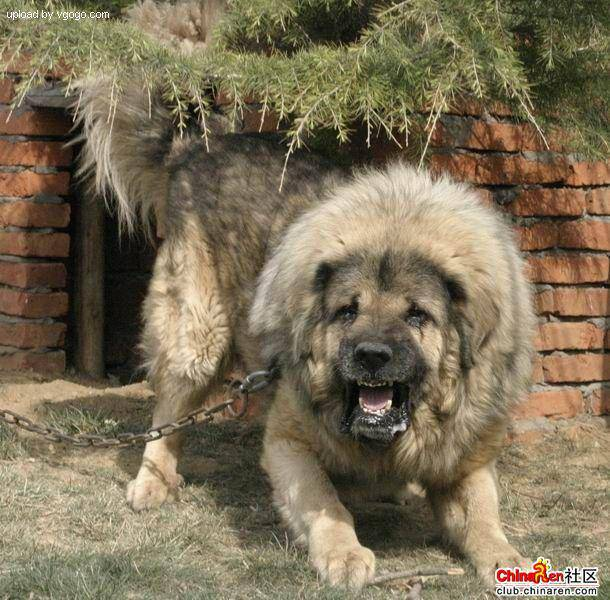

In [ ]:
# One more check
Image(filenames[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we now got our training image filepaths in a list, let's prepare our labels.

In [ ]:
import numpy as np
labels = labels_csv["breed"]
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See if number of labels matches the number of filenames
if len(labels)==len(filenames):
  print("Number of labels matches number of filenames")
else :
  print("Number of labels does not match number of filenames,check data directory!")

Number of labels matches number of filenames


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0]==unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into a boolean array
boolean_labels = [label==unique_breeds for label in labels]
len(boolean_labels)

10222

In [ ]:
# Example : Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds==labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int))# there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels [2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set
Since the dataset from Kaggle doesn't come with a validation set,we're going to create our own

In [ ]:
# Setup x & y variables
x = filenames
y = boolean_labels

We're going to start off experimenting with ~ 1000 images and increase as needed

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 # @param{type:"slider",min:1000,max:10000,step:1000}

In [ ]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split


# Split them into training and validation of total size NUM_IMAGES
x_train,x_val,y_train,y_val = train_test_split(x[:NUM_IMAGES],
                                               y[:NUM_IMAGES],
                                               test_size=0.2,
                                               random_state=42)
len(x_train),len(y_train),len(x_val),len(y_val)

(800, 800, 200, 200)

In [ ]:
# Let's have a look at trainig data
x_train[:2],y_train[:2]

(['drive/MyDrive/Dog vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog vision/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, Fal

## Preprocessing Images(turning images into Tensors)

To preprocess our images into Tensors we're going to write a function which does a few things :
1. Take an image filepath as an input
2. Use TensorFlow to read the file and save it to the variable `image`
3. Turn our `image`("jpg") into Tensors
4. Normalize our image (convert color channel values from 0-255 to 0-1)
5. Resize the `image` to be a shape of (224,224)
6. Return the modified image

In [ ]:
# Convert an image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [ ]:
# Turn image into the Tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

 Now we've seen what an image looks like as a tensor,let's make a function to preprocess them

In [ ]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def preprocess_image(image_path,img_size = IMG_SIZE):
  """
 Takes an image file path and turns it into a Tensor

  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical tensor with 3 color channels(Red,Green,Blue)
  image = tf.image.decode_jpeg(image,channels=3)
  # Convert the color channel value from 0 to 255 to 0-1 values(Normalization)
  image = tf.image.convert_image_dtype(image,tf.float32)
  # Resize the image to our desired value(224,224)
  image = tf.image.resize(image,size = [IMG_SIZE,IMG_SIZE])

  return image

## Turning our data into batches

Why turn our data into batches?

Let's say you're trying to process 10000+ images in one go,they al might not fit into memory

So that's why we do 32 images (batch size) at a time(you can manually adjust the batch size if needed)

In order to use TensorFlow effectively,we need our data in the form of Tensor tuples which look like this :
`(image,label)`

In [ ]:
# Create a simple function to return a tuple(image,label)

def get_image_label(image_path,label):
  """
Takes an image file path name and the associated label,processes
the image and returns a tuple of (image,label)

  """
  image = preprocess_image(image_path)
  return image,label

Now we've got a way to turn our data into tuples of tensors in the form : `(image,label)`,let's make a function to turn all of our data (x&y) into batches!


In [ ]:
# Define the batch dize, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn our data into batches
def create_data_batches(x,y=None,batch_size=BATCH_SIZE,valid_data=False,test_data=False):
  """
Creates batches of data out of image (x) and label (y) pairs.
Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
Also accepts test data as input (no labels).
  """
# If the data is a test data set we don't have labels

  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only filepaths
    data_batch = data.map(preprocess_image).batch(BATCH_SIZE)

    return data_batch

# If the data is a valid dataset we don't need to shuffle it

  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else :
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),tf.constant(y)))
    # Shuffling pathnames and labels before mapping  image preprocessor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(x))
    # Create (image,label) tuples(this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)
    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)

    return data_batch


In [ ]:
# Create training and validation data batches
train_data = create_data_batches(x_train,y_train)
val_data = create_data_batches(x_val,y_val,valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:

# Check out the different attributes of our data batches
train_data.element_spec,val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing data batches
Our data is now in batches,however, these can be a little hard to understand,let's visualize them

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images,labels):
  """
  Displays a plot of 25 images and labels from a data batch
  """
  # Setup a figure
  plt.figure(figsize=(10,10))
  # Loop through 25(for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows , 5 columns)
    ax = plt.subplot(5,5,i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")


In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
train_images,train_labels = next(train_data.as_numpy_iterator())
len(train_images),len(train_labels)

(32, 32)

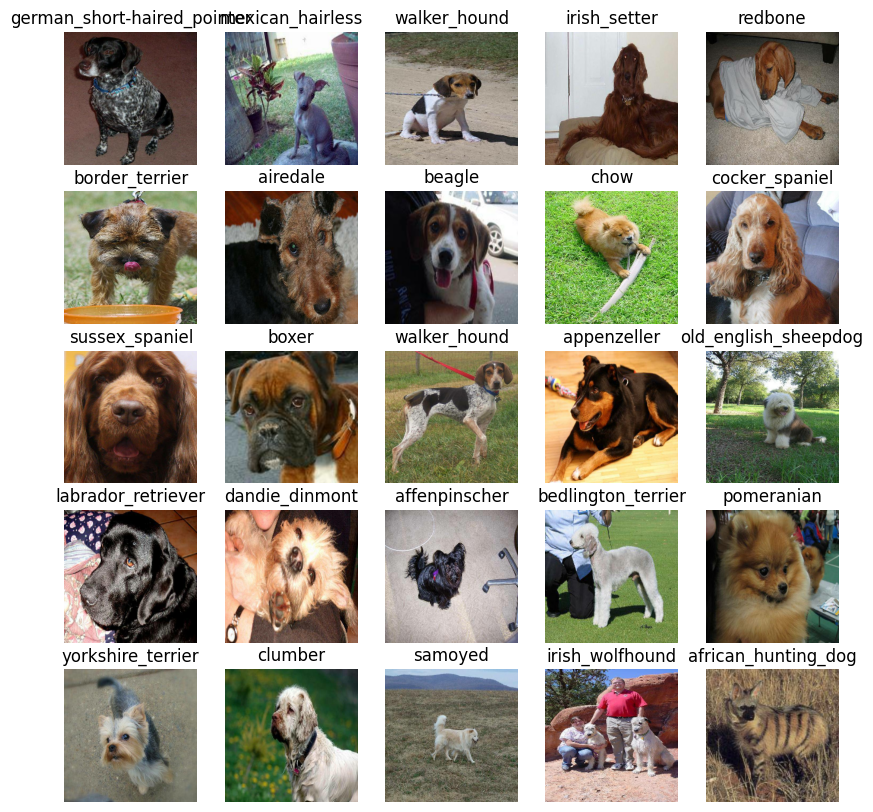

In [ ]:
# Now let's visualize data in a training batch
show_25_images(train_images,train_labels)

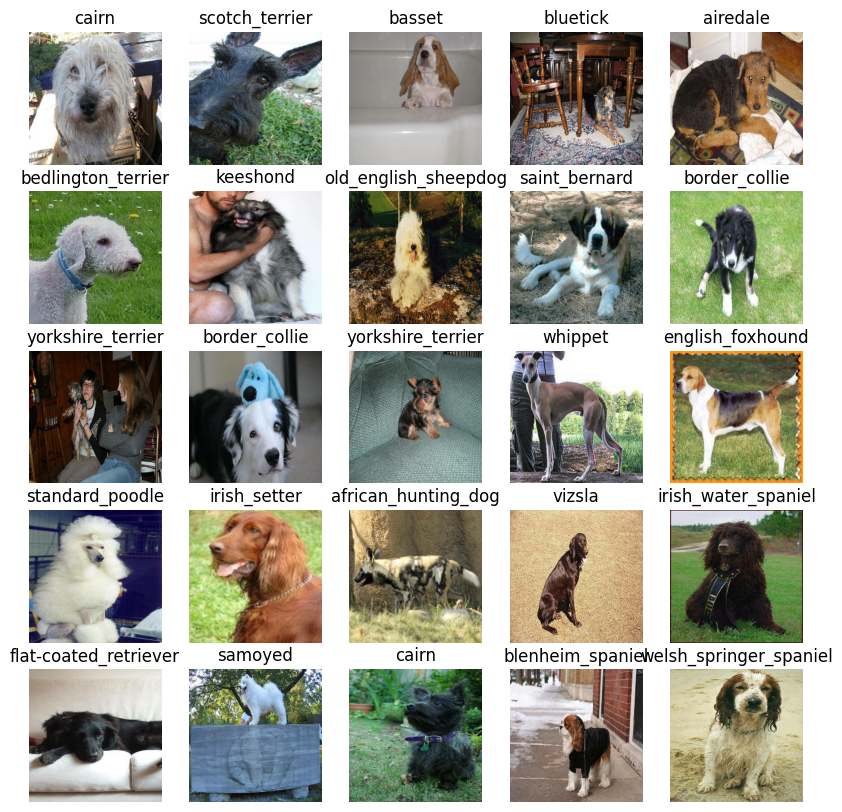

In [ ]:
# Now let's visualize our validation set
val_images,val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images,val_labels)

## Building a model

Before we build a model, there are a few things we need to define :
* The input shape (our images shape in the form of Tensors) of our model
* The output shape(image labels,in the form of Tensors) of our model
* The URL of the model we want to use from TensorFlow Hub


In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None,IMG_SIZE,IMG_SIZE,3] # batch, height, width, color channel

# Setup output shape of the model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"


Now we've got our inputs,outputs and model ready to go.
Let's put them together into a Keras deep learning model!

Knowing this let's create a function which :
* Takes the input shape,output shape and the model we've chosen as parameters
* Defines the layers in a Keras model in a sequential fashion(do this first,then that)
* Compiles the model(says how it should be evaluated and improved)
* Build the model(tells the model the input shape it'll be getting)
* Returns the model

In [ ]:
# Create a function which creates a Keras model
def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE,model_url=MODEL_URL):
  print("Building model with:",MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
      #tf.keras.layers.InputLayer(input_shape=INPUT_SHAPE),
      hub.KerasLayer(MODEL_URL,trainable = False), # Layer 1(input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="softmax")   # Layer 2 (output layer)
 ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model


In [ ]:
!pip install tensorflow==2.15.0 tensorflow-hub==0.13.0 keras==2.15.0

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 475.3/475.3 MB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100.6/100.6 kB 9.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 75.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 58.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 118.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 442.0/442.0 kB 34.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.4/78.4 kB 7.6 MB/s eta 0:00:00
  Attempting uninstall: wrapt
    Found existing installation: wrapt 1.17.2
    Uninstalling wrapt-1.17.2:
      Successfully uninstalled wrapt-1.17.2
  Attempting uninstall: tensorflow-hub
    Found existing installation: tensorflow-hub 0.16.1
    Uninstalling tensorflow-hub-0.16.1:
      Successfully uninstalled tensorflow-hub-0.16.1
  Attempting uninstall: ml-dtypes
    Found existing installation: ml-dtypes 0.4.1
    Uninstalling ml-dtypes-0

In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creating callbacks

Callbacks are helper functions a model can use during training to do such things as swave its progress,check its progress or stop training early if the model stops improving

We'll create 2 callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training too long

### TensorBoard Callback

To set up a TensorBoard callback we need to do 3 things :
1. Load the TensorBoard notebook extension
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function
3. Visualize our model's training logs with the `%tensorboard` magic function(we'll do this after model training)

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/Dog vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

Early stopping helps our model from overfitting by stopping training if a certain evaluation metric stops improving

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model(on a subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working

In [ ]:
NUM_EPOCHS = 100 #@param{type:"slider",min:10,step:10}

In [ ]:
# Check to make sure we're still running on a gpu
print("GPU","available" if tf.config.list_physical_devices("GPU") else "not available")

GPU not available


Let's create a function which trains our model

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback`
* Call the `fit()` function on our model passing it the training data,validation data,number of epochs to train for(NUM_EPOCHS) and the callbacks we'd like to use
* Return the model

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
Trains a given model on data from training_data and returns the trained version
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session every time we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard,early_stopping])

  # Return the model
  return model


In [ ]:
# Fit the model to the data
model = train_model()


Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 134s 5s/step - loss: 4.7024 - accuracy: 0.0913 - val_loss: 3.6009 - val_accuracy: 0.2250
Epoch 2/100
25/25 [==============================] - 49s 2s/step - loss: 1.7087 - accuracy: 0.6725 - val_loss: 2.2661 - val_accuracy: 0.5350
Epoch 3/100
25/25 [==============================] - 48s 2s/step - loss: 0.5849 - accuracy: 0.9438 - val_loss: 1.6963 - val_accuracy: 0.6250
Epoch 4/100
25/25 [==============================] - 57s 2s/step - loss: 0.2569 - accuracy: 0.9875 - val_loss: 1.5106 - val_accuracy: 0.6400
Epoch 5/100
25/25 [==============================] - 48s 2s/step - loss: 0.1495 - accuracy: 0.9962 - val_loss: 1.4339 - val_accuracy: 0.6450
Epoch 6/100
25/25 [==============================] - 52s 2s/step - loss: 0.1015 - accuracy: 1.0000 - val_loss: 1.3892 - val_accuracy: 0.6550
Epoch 7/100
25/25 [==============================] - 49s 2s/

**Question:** It looks like our model is overfitting because it's performing far better on the training dataset than on the validation dataset,what are some ways to prevent model overfitting in deep learning neural networks

**Note:** Overfitting to begin with is a good thing! It means our model is learning

### Checking the TensorBoard logs

The TensorBoard magic func(`%tensorboard`) will acess the logs directory we created earlier and visualize its contents


In [ ]:
%tensorboard --logdir drive/MyDrive/Dog\ vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [ ]:
# Make predictions on the validation data(not used to train on)
predictions = model.predict(val_data,verbose=1)
predictions

7/7 [==============================] - 11s 1s/step


array([[5.0168147e-04, 2.1137577e-04, 4.5528138e-04, ..., 5.0966028e-04,
        4.6072473e-05, 1.2844999e-03],
       [2.9218656e-03, 2.3538536e-04, 2.7763935e-02, ..., 4.3998408e-04,
        3.0394942e-03, 1.1262255e-04],
       [8.8571933e-06, 6.4434130e-06, 1.1719123e-05, ..., 1.9639674e-05,
        1.4948244e-05, 1.2766533e-04],
       ...,
       [1.1081795e-06, 1.8970473e-05, 1.4595370e-05, ..., 1.1872416e-05,
        9.3164017e-06, 2.0573369e-05],
       [3.4617861e-03, 1.1426957e-03, 3.7231529e-04, ..., 1.1230593e-04,
        5.0628649e-05, 1.8659763e-02],
       [7.8326295e-05, 4.8773404e-06, 9.9488490e-05, ..., 3.4609047e-04,
        1.4393461e-04, 4.6344168e-05]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
np.sum(predictions[0])

1.0

In [ ]:
# First prediction
index = 0
print(predictions[0])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[5.01681468e-04 2.11375766e-04 4.55281377e-04 5.52763740e-05
 9.66618463e-05 4.49839281e-05 1.56878252e-02 5.09149453e-04
 2.66551448e-04 1.98099704e-04 3.51564842e-04 1.88567414e-04
 3.20070307e-04 2.60067201e-04 2.25078198e-04 2.24788499e-04
 2.59904918e-05 1.97662473e-01 6.02730397e-05 1.39104013e-04
 2.36298030e-04 1.84992663e-04 6.19044149e-05 3.30676837e-03
 6.61914237e-05 4.21890669e-04 4.07644659e-02 2.10030179e-04
 1.36040966e-03 2.61427165e-04 1.57440547e-04 2.33887215e-04
 1.78588991e-04 7.53633230e-06 6.87821303e-05 1.65860839e-02
 7.16993891e-05 2.57838055e-05 3.65789965e-05 7.36345610e-05
 7.86241668e-04 2.74615377e-05 4.37045732e-04 6.69106375e-05
 1.51465501e-05 1.93732951e-04 3.39235085e-05 1.76977701e-04
 3.18826118e-04 5.93198929e-04 6.96993811e-05 1.58020732e-04
 5.49897435e-04 4.79421651e-05 4.83359254e-05 7.24335332e-05
 2.25905373e-04 2.03363132e-03 2.41184593e-04 3.58743042e-01
 3.79093719e-04 6.32060328e-05 4.38709231e-03 3.40423830e-05
 8.04988202e-04 1.487556

Having the above functionality is great,but we want to be able to do it at a scale.

And it would be even better if we could see the image the prediction is being made on!

**Note:** Prediction probabilities are also known as confidence levels

In [ ]:
# Turn prediction probabilities into the respective label(easier to understand)

def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label

  """
  return unique_breeds[np.argmax(prediction_probabilities)]


In [ ]:
# Get a predicted label based on an array of prediction probabilities

pred_label = get_pred_label(predictions[0])
pred_label

'irish_wolfhound'

Since our validation data is still in a batch dataset,we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels(truth labels)

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a function to unbatch a batch dataset

def unbatchify(data):
  """
  Takes a batched dataset of (image,label) Tensors and returns separate arrays
  of images and labels
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images,labels

val_images,val_labels = unbatchify(val_data)
val_images[0],val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
images_ = []
labels_ = []

# Loop through unbatched data
for image,label in val_data.unbatch().as_numpy_iterator():
  print(image.shape,label)
  images_.append(image)
  labels_.append(unique_breeds[np.argmax(label)])


(224, 224, 3) [False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False  True False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False]
(224, 224, 3) [False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False Fal

In [ ]:
get_pred_label(labels_[0])

NameError: name 'get_pred_label' is not defined

In [ ]:
get_pred_label(predictions[0])

Now we've got ways to get :
* Prediction lables
* Validation labels(truth labels)
* Validation images

Let's make some function to make these all a bit more visualize

We'll create a function which:
* Takes an array of prediction probabilities , an array of truth labels and an array of images and integers
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability,the truth label and the target image on a single plot



In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:

def plot_pred(prediction_probabilities,labels,images,n=1):
  """
  View the prediction,ground truth label and image for sample n
  """

  pred_prob, true_label, image = prediction_probabilities[n],labels[n],images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title dependimg if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted ,probability of prediction and truth label

  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)




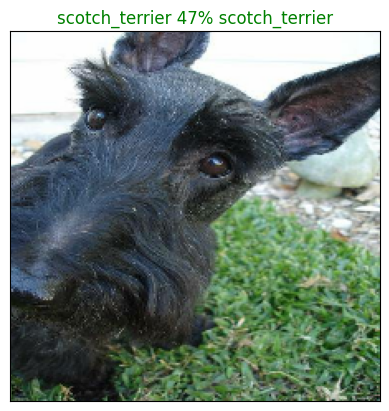

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images)

Now we've got one function to visualize our models top prediction,let's make another to view our models top 10 predictions

This function will:
* Take an input of prediction probabilities array and ground truth array as an integer
* Find the predicted label using `get_pred_label()`
* Find the top 10 predicted labels and their prediction probabilities
* Plot the top 10 predicted labels and their prediction probabilities,coloring the true label green

In [ ]:
# top 10 indexes of prediciton 0
predictions[0].argsort()[-10:][::-1]


array([ 59,  17, 103,  73, 102,  26, 106,  35,  76, 116])

In [ ]:
def plot_pred_conf(prediction_probabilities,labels,n=1):
  """
  Plot the top 10 highest prediction confidences along with the truth
  label for sample n

  """
  pred_prob,true_label = prediction_probabilities[n],labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = predictions[0].argsort()[-10:][::-1]

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find top 10 prediciton labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,rotation="vertical")

  # Change the color of the true label
  if np.isin(true_label,top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

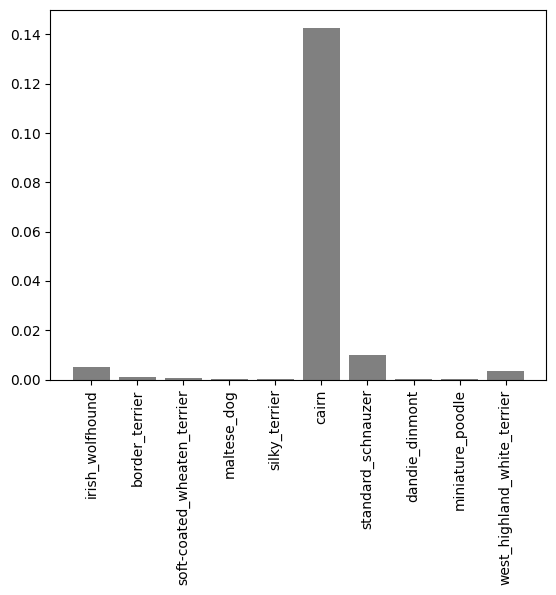

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=1)

Now we've got some functions to help us visualize our predictions and evaluate our model
Let's check out a few

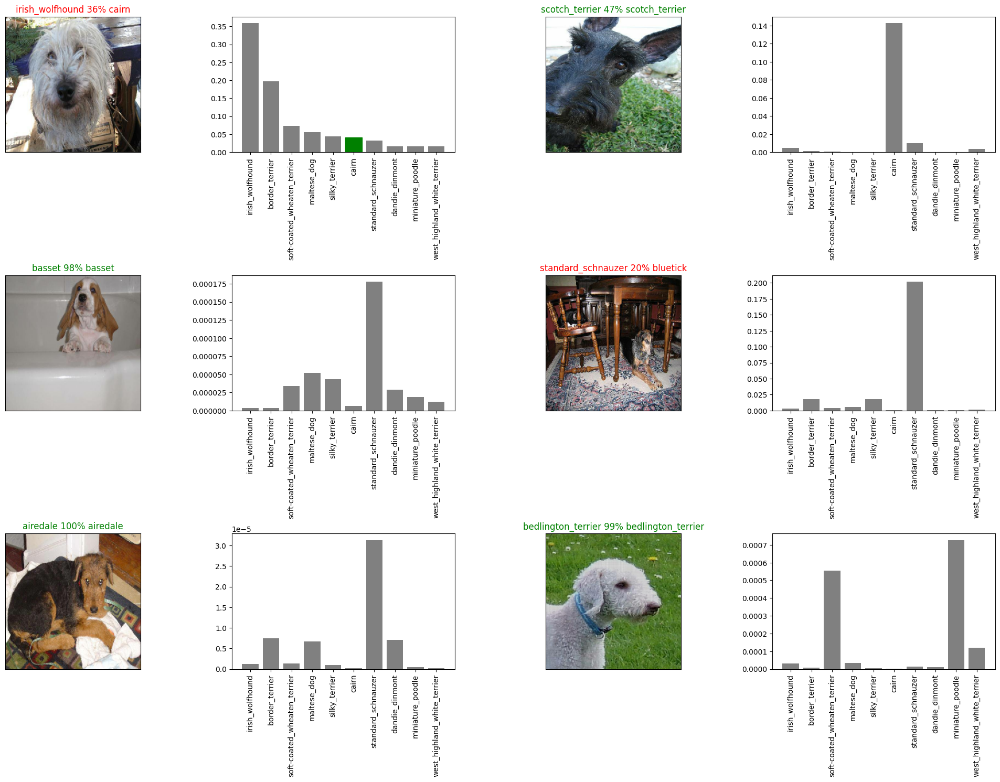

In [ ]:
# Let's check out a few predictions and their different value
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows,2*num_cols,2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows,2*num_cols,2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

**Challenge:** How would you create a confusion matrix with our models predictions and true labels?

## Saving and reloading a trained model

In [ ]:
# Create a function to save a model
def save_model(model,suffix=None):
  """
  Saves a given model in a models directory and appends a suffix(string)
  for separating models from each other
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/Dog vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from specified path
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Now we've got functions to save and load a trained model,let's make sure they work

In [ ]:
# Save our model trained on 1000 images
save_model = save_model(model,suffix="1000-images-mobilenetv2-100-epochs")

Saving model to: drive/MyDrive/Dog vision/models/20250305-12161741177001-1000-images-mobilenetv2-100-epochs.h5...


/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
# Load a trained model
loaded_1000_images_model = load_model(save_model)

Loading saved model from: drive/MyDrive/Dog vision/models/20250305-12161741177001-1000-images-mobilenetv2-100-epochs.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 8s 1s/step - loss: 1.2472 - accuracy: 0.6900


[1.247202754020691, 0.6899999976158142]

In [ ]:
# Evaluate the loaded model
loaded_1000_images_model.evaluate(val_data)

7/7 [==============================] - 10s 1s/step - loss: 1.2472 - accuracy: 0.6900


[1.247202754020691, 0.6899999976158142]

## Training a big dog model🐶 (on the full data)

In [ ]:
# Create a data batch with the full dataset
full_data = create_data_batches(x,y)

Creating training data batches...


In [ ]:
full_data

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

**Note:**Running the cell below will take a little while (maybe up to 30 minutes for the first epoch) because the GPU we're using in the runtime has to load all of the images into memory

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 1009s 3s/step - loss: 1.3401 - accuracy: 0.6672
Epoch 2/100
320/320 [==============================] - 489s 2s/step - loss: 0.4020 - accuracy: 0.8805
Epoch 3/100
320/320 [==============================] - 494s 2s/step - loss: 0.2352 - accuracy: 0.9381
Epoch 4/100
320/320 [==============================] - 485s 2s/step - loss: 0.1547 - accuracy: 0.9648
Epoch 5/100
320/320 [==============================] - 485s 2s/step - loss: 0.1083 - accuracy: 0.9768
Epoch 6/100
320/320 [==============================] - 489s 2s/step - loss: 0.0776 - accuracy: 0.9861
Epoch 7/100
320/320 [==============================] - 477s 1s/step - loss: 0.0586 - accuracy: 0.9917
Epoch 8/100
320/320 [==============================] - 477s 1s/step - loss: 0.0453 - accuracy: 0.9948
Epoch 9/100
320/320 [==============================] - 484s 2s/step - loss: 0.0377 - accuracy: 0.9965
Epoch 10/100
320/320 [==============================] - 481s 2s/step - loss: 0.03

In [ ]:
saved_full_model_path = save_model(full_model, suffix="full-image-set-mobilenetv2-100-epochs")

Saving model to: drive/MyDrive/Dog vision/models/20250305-15321741188736-full-image-set-mobilenetv2-100-epochs.h5...


/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
loaded_full_model = load_model(saved_full_model_path)

Loading saved model from: drive/MyDrive/Dog vision/models/20250305-15321741188736-full-image-set-mobilenetv2-100-epochs.h5


## Making predictions on the test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data,we'll have to get it into the same format#

Luckily we created ``create_data_batches()` earlier which can take a list of filenames as input and convert them into Tensor batches

To make predictions on the test data we'll:
* Get the test image filenames
* Convert the filenames in to test data batches and setting the `test_data` to true parameter(since test data doesn't have labels)
* Make a predictions array by passing the test batches to the `predict()` method called on our model

In [ ]:
# Load test image filenames
test_path = "drive/MyDrive/Dog vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog vision/test/d2fb2b794e4658bacb515a878d86fc68.jpg',
 'drive/MyDrive/Dog vision/test/d0a25ae7243819f51992a327530a09f7.jpg',
 'drive/MyDrive/Dog vision/test/d45091e26d64a67364891acce1181b91.jpg',
 'drive/MyDrive/Dog vision/test/d9ff293c85c9263083b0369b9bad654e.jpg',
 'drive/MyDrive/Dog vision/test/d55f8b47382486e64750c23bed27ce13.jpg',
 'drive/MyDrive/Dog vision/test/d81bede62a151c338f494763ae1e6bc5.jpg',
 'drive/MyDrive/Dog vision/test/cf44ef742a1c5140d54a0c3cdcd73686.jpg',
 'drive/MyDrive/Dog vision/test/d029b3c425cd0c5e8a3de3969be1a295.jpg',
 'drive/MyDrive/Dog vision/test/cff0b4780b519e569f3478550504b02f.jpg',
 'drive/MyDrive/Dog vision/test/db2b8aeb5293d771b5edb1d34d94edf2.jpg']

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames,test_data=True)

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,verbose=1)

In [ ]:
# Save prediction (NumpPy array) to csv file(for access later)
np.savetxt("drive/MyDrive/Dog vision/preds_array.csv",test_predictions,delimiter=",")

In [ ]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("drive/MyDrive/Dog vision/preds_array.csv",delimiter=",")

## Preparing test data set predictions for Kaggle
Looking at the Kaggle sample submission we find that it wants our models prediction probability outputs in a DataFrame with ID and a column for each different dog breed

To get data in this format we'll :
* Create a pandas DataFrame with an ID column as well as a column for each dog breed
* Add data to the ID column by extracting the test image ID's from their filepaths
* Export the DataFrame as a CSV to submit it to Kaggle

In [ ]:
# Create a pandas DataFrame
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df

In [ ]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids
preds_df

In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

In [ ]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("drive/MyDrive/Dog vision/full_model_predictions_submission_1_mobilenetV2.csv",index=False)

## Making predictions on custom images
 To make predictions on custom images we'll :
 * Get the filepaths of our own images
 * Convert the filepaths into test data batches usinf `create_data_batches()`.And since our custom images won't have labels,we set the `test_data` parameter to True
 * Make a predictions array by passing the test batches to the `predict()` method called on our model
 * Convert the prediction probabilities to prediction labels
 * Compare the predicted labels to the custom images


In [ ]:
# Get custom image filepaths
custom_path = "drive/MyDrive/Dog vision/my-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)
if not fname.startswith('.') and os.path.isfile(os.path.join(custom_path, fname))]

In [ ]:
# Turn custom images into batch data set
custom_data = create_data_batches(custom_image_paths,test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on the custom data
custom_preds = full_model.predict(custom_data)
custom_preds

1/1 [==============================] - 0s 219ms/step


array([[2.25691354e-09, 7.28949317e-07, 7.40094184e-12, 1.05297363e-06,
        1.79450216e-12, 8.16977541e-10, 9.61662749e-07, 2.65266276e-09,
        9.40799993e-10, 2.59297750e-10, 1.21658505e-09, 1.56330370e-05,
        1.02142784e-12, 3.47378955e-04, 6.59684190e-07, 1.90124083e-05,
        7.76724629e-10, 2.09151040e-07, 1.59395847e-06, 2.36189679e-10,
        2.28012769e-12, 1.93542578e-12, 1.17030645e-07, 1.21400209e-10,
        1.45278161e-03, 8.95344243e-08, 5.26608304e-08, 1.00138087e-09,
        1.04319579e-05, 5.41959480e-06, 1.22319477e-06, 2.00702871e-05,
        5.21504208e-02, 9.19052479e-09, 5.22313359e-10, 3.48334517e-08,
        3.42390094e-09, 2.01588124e-09, 2.14275492e-15, 4.37809816e-10,
        1.04462251e-03, 6.15142596e-07, 7.52235323e-08, 2.14227313e-07,
        6.31783280e-07, 8.61080718e-09, 1.50304855e-11, 1.51266166e-09,
        9.83165372e-13, 9.34331268e-02, 2.32366215e-09, 2.55281396e-08,
        1.22351381e-07, 6.69781244e-11, 1.71857039e-14, 2.766404

In [ ]:
# Get custom image prediciton labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels


['toy_poodle', 'cocker_spaniel', 'cocker_spaniel', 'cocker_spaniel']

In [ ]:
# Get custom images (our unbatchify() function won't work since there aren't labels)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

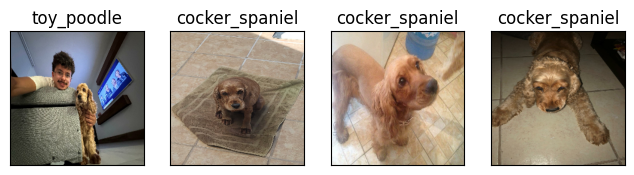

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10,10))
for i,image in enumerate(custom_images):
  plt.subplot(2,5,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)